In [1]:
import torch

In [2]:
# read in names.txt
words = open('names.txt').read().split()

In [3]:
# # construct bigrams
# b = {}
# for w in words:
#     chs = ['<S>'] + list(w) + ['<E>']
#     for ch1, ch2 in zip(chs, chs[1:]):
#         bigram = (ch1, ch2)
#         b[bigram] = b.get(bigram, 0) + 1

In [22]:
# break down name into bigrams
w = 'anson'
chs = ['.'] + list(w) + ['.']
bigrams = zip(chs, chs[1:])
list(bigrams)

[('.', 'a'), ('a', 'n'), ('n', 's'), ('s', 'o'), ('o', 'n'), ('n', '.')]

In [4]:
# setup st-->id and id-->st mappings
N = torch.zeros((27, 27), dtype=torch.int32)
chars = sorted(list(set(''.join(words))))
stoi = {ch: i+1 for i, ch in enumerate(chars)}
stoi['.'] = 0
itos = {i: ch for ch, i in stoi.items()}

In [5]:
# setup N matrix: N[i,j] is the number of times character i is followed by character j
for w in words:
    chs = ['.'] + list(w) + ['.']
    for ch1, ch2 in zip(chs, chs[1:]):
        N[stoi[ch1], stoi[ch2]] += 1


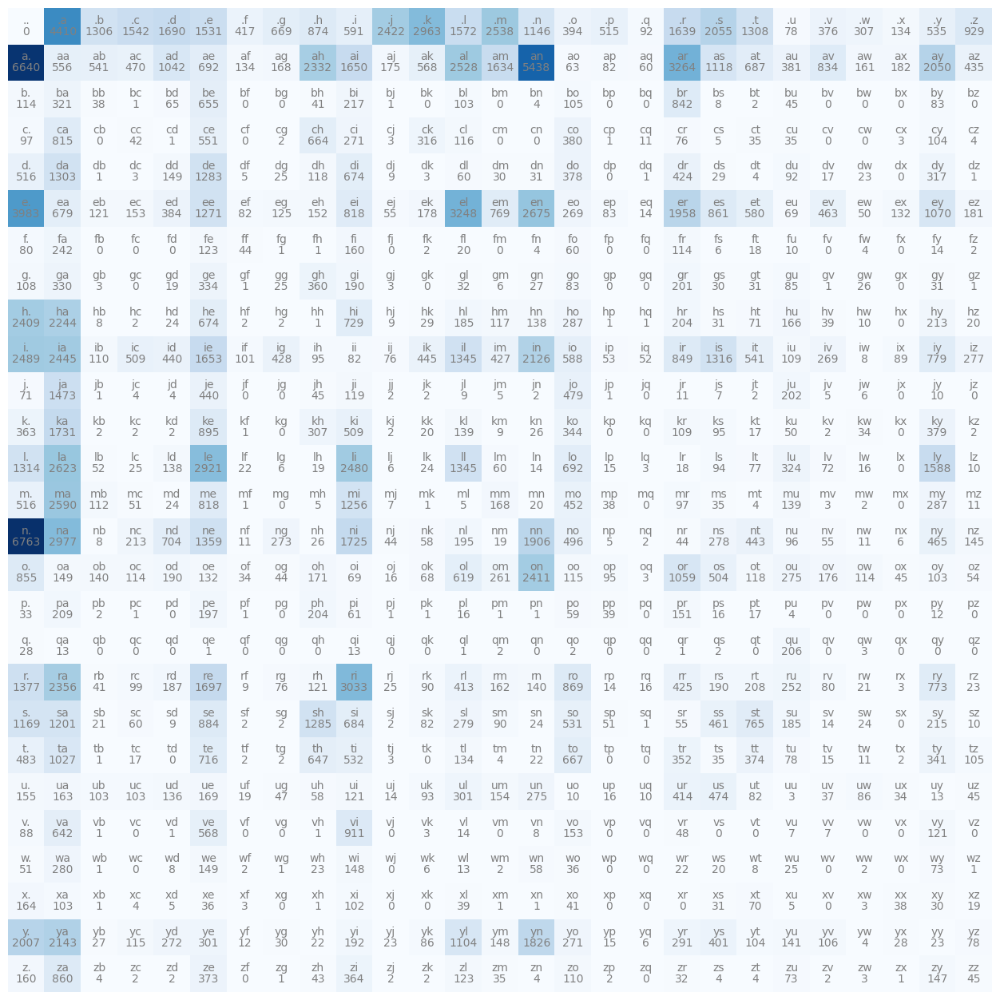

In [6]:
# Plot the matrix

import matplotlib.pyplot as plt
%matplotlib inline

plt.figure(figsize=(16, 16))
plt.imshow(N, cmap='Blues')

for i in range(27):
    for j in range(27):
        chstr = itos[i] + itos[j]
        plt.text(j, i, chstr, ha='center', va='bottom', color='gray')
        plt.text(j, i, N[i, j].item(), ha='center', va='top', color='gray')
plt.axis('off');

In [7]:
# normalize all of P into probabilities
P = (N+1).float()
P /= P.sum(dim=1, keepdim=True)

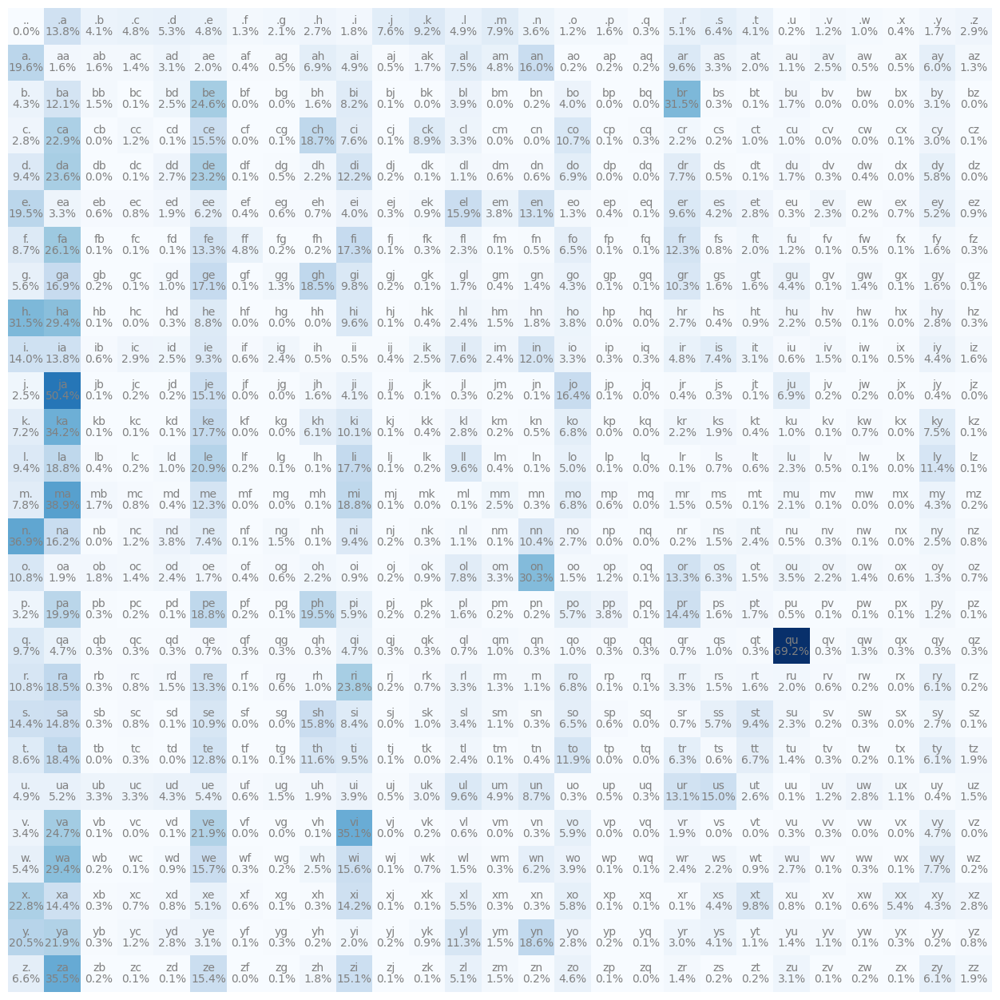

In [8]:
# plot P matrix 
plt.figure(figsize=(16, 16))
plt.imshow(P, cmap='Blues')
plt.axis('off');
for i in range(27):
    for j in range(27):
        chstr = itos[i] + itos[j]
        plt.text(j, i, chstr, ha='center', va='bottom', color='gray')
        plt.text(j, i, f"{100*P[i, j].item():.1f}%", ha='center', va='top', color='gray')


In [9]:
# generate some names using the bigram model
g = torch.Generator().manual_seed(2147483647)
for i in range(10):
    ix = 0
    print(itos[ix], end='')
    while True:
        p = P[ix]
        ix = torch.multinomial(p, num_samples=1, replacement=True, generator=g).item()
        print(itos[ix], end='')
        if ix == 0:
            print()
            break

.cexze.
.momasurailezitynn.
.konimittain.
.llayn.
.ka.
.da.
.staiyaubrtthrigotai.
.moliellavo.
.ke.
.teda.


In [19]:
log_likelihood = 0 # running sum of log probabilities
n = 0 # number of samples

# for every word in the dataset
for w in words:
    # break down into bigrams
    chs = ['.'] + list(w) + ['.']
    bigrams = zip(chs, chs[1:])
    # for every bigram
    for ch1, ch2 in bigrams:
        # lookup probability of ch2 given ch1
        ix1 = stoi[ch1]
        ix2 = stoi[ch2]
        prob = P[ix1, ix2]
        # add log likelihood to running sum
        logprob = torch.log(prob)
        log_likelihood += logprob
        # increment number of samples
        n += 1
        
        print(f'{ch1} -> {ch2} : {logprob:.4f}')
    
print(f'log likelihood: {log_likelihood:.4f}')
loss = -log_likelihood / n
print(f'loss: {loss:.4f}')

. -> e : -3.0410
e -> m : -3.2793
m -> m : -3.6753
m -> a : -0.9454
a -> . : -1.6305
. -> o : -4.3965
o -> l : -2.5526
l -> i : -1.7293
i -> v : -4.1845
v -> i : -1.0476
i -> a : -1.9807
a -> . : -1.6305
. -> a : -1.9835
a -> v : -3.7041
v -> a : -1.3971
a -> . : -1.6305
. -> i : -3.9919
i -> s : -2.5998
s -> a : -1.9119
a -> b : -4.1363
b -> e : -1.4044
e -> l : -1.8396
l -> l : -2.3408
l -> a : -1.6733
a -> . : -1.6305
. -> s : -2.7468
s -> o : -2.7270
o -> p : -4.4180
p -> h : -1.6364
h -> i : -2.3485
i -> a : -1.9807
a -> . : -1.6305
. -> c : -3.0339
c -> h : -1.6774
h -> a : -1.2251
a -> r : -2.3405
r -> l : -3.4256
l -> o : -3.0047
o -> t : -4.2032
t -> t : -2.7031
t -> e : -2.0549
e -> . : -1.6357
. -> m : -2.5358
m -> i : -1.6687
i -> a : -1.9807
a -> . : -1.6305
. -> a : -1.9835
a -> m : -3.0321
m -> e : -2.0971
e -> l : -1.8396
l -> i : -1.7293
i -> a : -1.9807
a -> . : -1.6305
. -> h : -3.6011
h -> a : -1.2251
a -> r : -2.3405
r -> p : -6.7434
p -> e : -1.6711
e -> r : -2.34

# Using pytorch instead of matrix

In [11]:
# GOAL: maximize likelihood of the data wrt model parameters (stastical modeling)
# equivalent to maximizing the log likelihood (because log is monotonic)
# equivalent to minimizing the negative log likelihood (NLL)
# equivalent to minimizing the average negative log likelihood (loss)
# log(a*b*c) = log(a) + log(b) + log(c)

In [12]:
# create the training set of the bigrams 
xs, ys = [], []
for w in words:
    chs = ['.'] + list(w) + ['.']
    for ch1, ch2 in zip(chs, chs[1:]):
        ix1 = stoi[ch1]
        ix2 = stoi[ch2]
        print(f'{ch1} -> {ch2} : {ix1} -> {ix2}')
        xs.append(ix1)
        ys.append(ix2)
xs = torch.tensor(xs)
ys = torch.tensor(ys)

. -> e : 0 -> 5
e -> m : 5 -> 13
m -> m : 13 -> 13
m -> a : 13 -> 1
a -> . : 1 -> 0
. -> o : 0 -> 15
o -> l : 15 -> 12
l -> i : 12 -> 9
i -> v : 9 -> 22
v -> i : 22 -> 9
i -> a : 9 -> 1
a -> . : 1 -> 0
. -> a : 0 -> 1
a -> v : 1 -> 22
v -> a : 22 -> 1
a -> . : 1 -> 0
. -> i : 0 -> 9
i -> s : 9 -> 19
s -> a : 19 -> 1
a -> b : 1 -> 2
b -> e : 2 -> 5
e -> l : 5 -> 12
l -> l : 12 -> 12
l -> a : 12 -> 1
a -> . : 1 -> 0
. -> s : 0 -> 19
s -> o : 19 -> 15
o -> p : 15 -> 16
p -> h : 16 -> 8
h -> i : 8 -> 9
i -> a : 9 -> 1
a -> . : 1 -> 0
. -> c : 0 -> 3
c -> h : 3 -> 8
h -> a : 8 -> 1
a -> r : 1 -> 18
r -> l : 18 -> 12
l -> o : 12 -> 15
o -> t : 15 -> 20
t -> t : 20 -> 20
t -> e : 20 -> 5
e -> . : 5 -> 0
. -> m : 0 -> 13
m -> i : 13 -> 9
i -> a : 9 -> 1
a -> . : 1 -> 0
. -> a : 0 -> 1
a -> m : 1 -> 13
m -> e : 13 -> 5
e -> l : 5 -> 12
l -> i : 12 -> 9
i -> a : 9 -> 1
a -> . : 1 -> 0
. -> h : 0 -> 8
h -> a : 8 -> 1
a -> r : 1 -> 18
r -> p : 18 -> 16
p -> e : 16 -> 5
e -> r : 5 -> 18
r -> . : 18

In [37]:
xs.shape

torch.Size([228146])

In [13]:
# randomly initialize 27 neuron weights, each neuron recieves 27 inputs 
g = torch.Generator().manual_seed(2147483647)
W = torch.randn((27, 27), generator=g, requires_grad=True)

tensor([1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0.])

In [32]:
import torch.nn.functional as F

# gradient descent
for k in range(100):
    # forward pass
    xenc = F.one_hot(xs, num_classes=27).float() # input to the network: one-hot encoding
    logits = xenc @ W # predict log-counts
    counts = logits.exp() # counts, equivalent to N?
    probs = counts / counts.sum(dim=1, keepdim=True) # probabilities for next character

    ## 
    loss = -probs[torch.arange(len(ys)), ys].log().mean()
    regularized_loss = loss + 0.01*(W**2).mean()
    print(loss.item())

    # backward pass 
    W.grad = None # zero out the gradients
    loss.backward() # compute the gradients

    W.data -= 50 * W.grad # update the weights

2.474761962890625
2.4744763374328613
2.474200487136841
2.4739325046539307
2.4736719131469727
2.473418712615967
2.4731717109680176
2.4729316234588623
2.4726970195770264
2.472468852996826
2.472245454788208
2.4720280170440674
2.4718151092529297
2.4716079235076904
2.471404790878296
2.4712064266204834
2.471012592315674
2.47082257270813
2.4706368446350098
2.4704556465148926
2.470277786254883
2.470104217529297
2.469933271408081
2.469766616821289
2.4696030616760254
2.469442844390869
2.469285726547241
2.4691319465637207
2.4689810276031494
2.4688329696655273
2.4686875343322754
2.468545436859131
2.4684054851531982
2.4682681560516357
2.4681336879730225
2.4680016040802
2.4678714275360107
2.4677443504333496
2.4676194190979004
2.467496156692505
2.4673752784729004
2.467256784439087
2.467139720916748
2.4670252799987793
2.466912269592285
2.466801643371582
2.4666929244995117
2.466585636138916
2.466480016708374
2.466376304626465
2.4662742614746094
2.4661741256713867
2.4660749435424805
2.465977907180786
2.

In [15]:
# sampling the neural net
g = torch.Generator().manual_seed(2147483647)
for i in range(10):
    out = []
    ix = 0
    while True:
        xenc = F.one_hot(torch.tensor([ix]), num_classes=27).float()
        logits = xenc @ W # predict log-counts
        counts = logits.exp() # counts, equivalent to N?
        p = counts / counts.sum(1, keepdims=True)
        ix = torch.multinomial(p, num_samples=1, replacement=True, generator=g).item()
        if ix == 0:
            break
        out.append(itos[ix])
    print(''.join(out))

cexze
momasurailezityha
konimittain
llayn
ka
da
staiyaubrtthrigotai
moliellavo
ke
teda
